In [24]:
from pathlib import Path
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from mpdaf.obj import Cube
import regions
import sys
sys.path.append("../lib")
import moments
import extract

sns.set_context("talk")
sns.set_color_codes()

In [4]:
cubeA = Cube("../big-data/lmc-30dor-A-subcube-46-55.fits")
cubeB = Cube("../big-data/lmc-30dor-B-subcube-46-55.fits")
cubeC = Cube("../big-data/lmc-30dor-C-subcube-46-55.fits")
cubeD = Cube("../big-data/lmc-30dor-D-subcube-46-55.fits")

## Inspect the average spectrum for each field

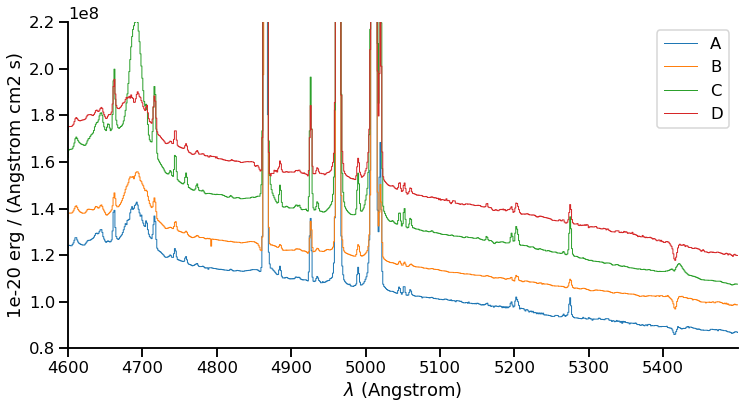

In [9]:
fig, ax = plt.subplots(figsize=(12, 6))
for cube, label in zip([cubeA, cubeB, cubeC, cubeD], "ABCD"):
    cube.sum(axis=(1, 2)).plot(label=label)
ax.legend()
ax.set(
    ylim=[0.8e8, 2.2e8],
)
sns.despine();

We can see the blue-bump from WR stars around 4700 Å.  This includes broad He II plus C III/IV, N III, and N V.  Hopefully, this will be restricted to particular regions in each field.

## Define continuum wavelength ranges

We can try the same wav ranges as we used for NGC 346

In [84]:
wavranges = [
    (4600, 4635), (4725, 4738), (4780, 4815), 
    #(4890, 4900), (4937, 4947), (4974, 4984), (5028, 5038), 
    (5070, 5100), (5120, 5145), (5220, 5260), (5300, 5340), (5470, 5500),
]

In [85]:
nv, ny, nx = cubeA.data.shape
ny, nx

(321, 319)

Split each field up into 4 roughly equal tiles:

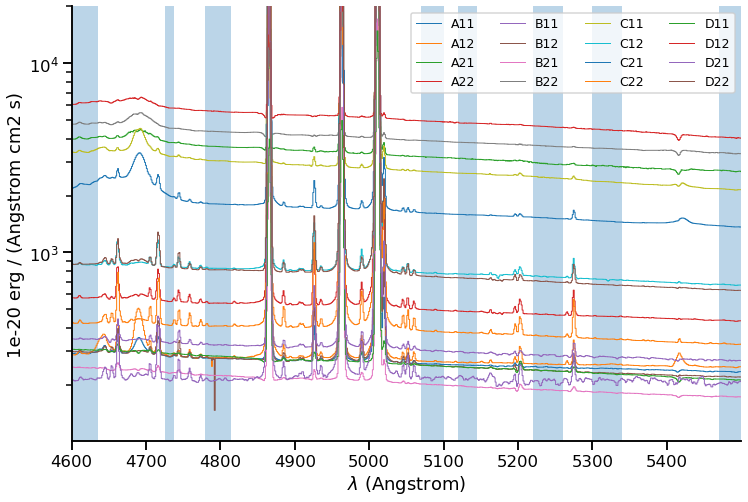

In [86]:
mm = 160 # middle of each image
fig, ax = plt.subplots(figsize=(12, 8))
for cube, label in zip([cubeA, cubeB, cubeC, cubeD], "ABCD"):
    cu11 = cube[:, :mm, :mm]
    cu12 = cube[:, :mm, mm:]
    cu21 = cube[:, mm:, :mm]
    cu22 = cube[:, mm:, mm:]    
    cu11.mean(axis=(1, 2)).plot(label=f"{label}11")
    cu12.mean(axis=(1, 2)).plot(label=f"{label}12")
    cu21.mean(axis=(1, 2)).plot(label=f"{label}21")
    cu22.mean(axis=(1, 2)).plot(label=f"{label}22")

for wavrange in wavranges:
    ax.axvspan(*wavrange, alpha=0.3)
ax.legend(ncol=4, fontsize="x-small")
ax.set(
    yscale="log",
    ylim=[None, 2e4],
)
sns.despine();

## Test the polynomial fitting with field A

This takes about a minute for each field.

In [87]:
contA = extract.fit_continuum(
    cubeA, wav_ranges=wavranges, deg=5, median=False,
)

extract.fit_continuum: row 0


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/chebyshev.py:1673: RankWarning: The fit may be poorly conditioned
  return pu._fit(chebvander, x, y, deg, rcond, full, w)


extract.fit_continuum: row 10
extract.fit_continuum: row 20
extract.fit_continuum: row 30
extract.fit_continuum: row 40
extract.fit_continuum: row 50
extract.fit_continuum: row 60
extract.fit_continuum: row 70
extract.fit_continuum: row 80
extract.fit_continuum: row 90
extract.fit_continuum: row 100
extract.fit_continuum: row 110
extract.fit_continuum: row 120
extract.fit_continuum: row 130
extract.fit_continuum: row 140


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:345: RuntimeWarning: divide by zero encountered in double_scalars
  off = (old[1]*new[0] - old[0]*new[1])/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:346: RuntimeWarning: divide by zero encountered in true_divide
  scl = newlen/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:414: RuntimeWarning: invalid value encountered in add
  return off + scl*x


extract.fit_continuum: row 150
extract.fit_continuum: row 160
extract.fit_continuum: row 170
extract.fit_continuum: row 180
extract.fit_continuum: row 190
extract.fit_continuum: row 200
extract.fit_continuum: row 210
extract.fit_continuum: row 220
extract.fit_continuum: row 230
extract.fit_continuum: row 240
extract.fit_continuum: row 250
extract.fit_continuum: row 260
extract.fit_continuum: row 270
extract.fit_continuum: row 280
extract.fit_continuum: row 290
extract.fit_continuum: row 300
extract.fit_continuum: row 310
extract.fit_continuum: row 320


### Inspect the results for different portions of the field. 

[(0.0, 800.0)]

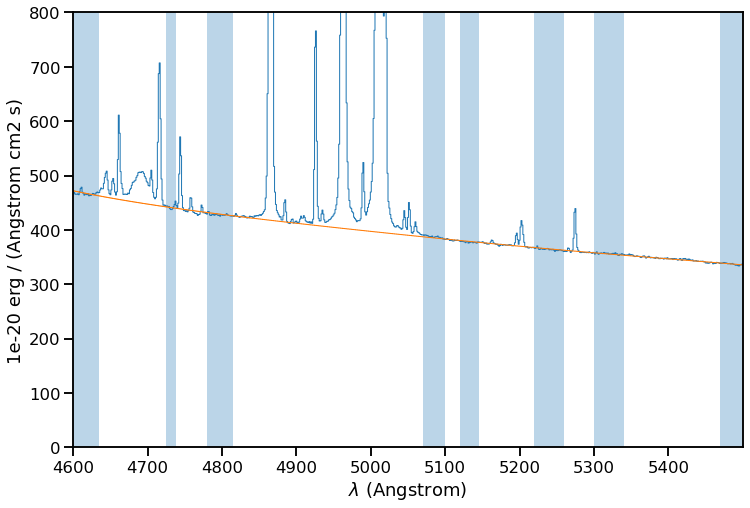

In [109]:
fig, ax = plt.subplots(figsize=(12, 8))
cubeA[:, 275:300, 120:150].mean(axis=(1, 2)).plot()
contA[:, 275:300, 120:150].mean(axis=(1, 2)).plot()
for wavrange in wavranges:
    ax.axvspan(*wavrange, alpha=0.3)
ax.set(ylim=[0, 800])

I had to go back and forth a few times adjusting the wav ranges.  It is difficult to get a good fit on the blue side because of the WR features. 

As can be seen here, the final version is not perfect – it slightly overpredicts the continuum around 4700 to 4800.  This might affect some of the weak [Fe III] lines, but the [Ar IV] 4740 does not seem to be much affected. 

### Look at some line images

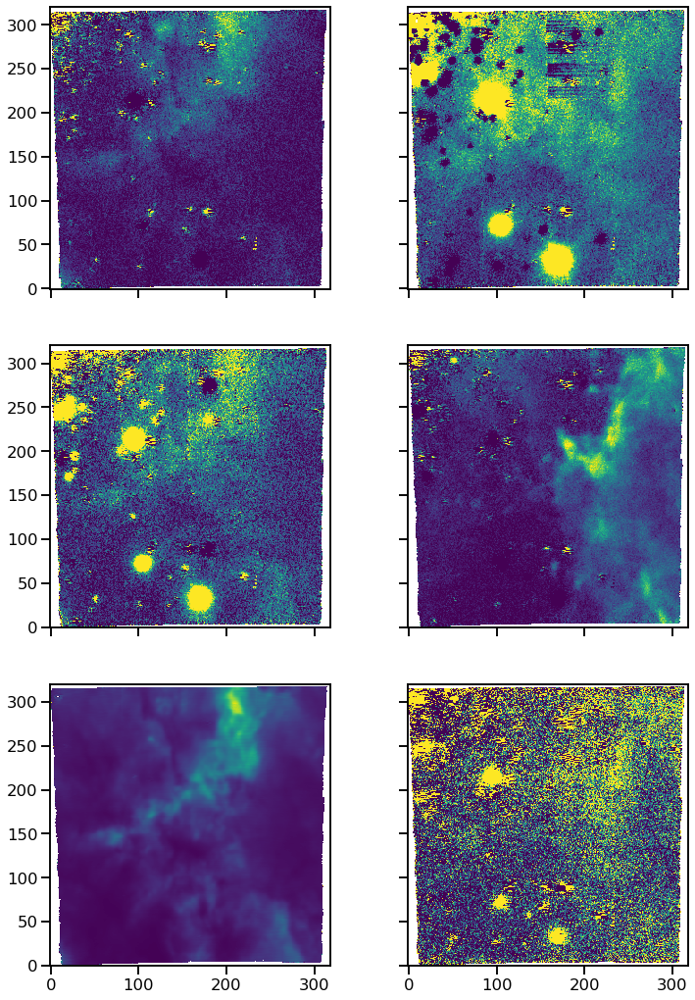

In [106]:
fig, axes = plt.subplots(
    3, 2, 
    figsize=(12, 18), 
    sharex=True, sharey=True
)
(cubeA - contA).select_lambda(4740, 4750).sum(axis=0).plot(
    ax=axes[0, 0], vmin=-10, vmax=1000,
)
(cubeA - contA).select_lambda(4685, 4692).sum(axis=0).plot(
    ax=axes[0, 1], vmin=-10, vmax=500,
)
(cubeA - contA).select_lambda(4630, 4650).sum(axis=0).plot(
    ax=axes[1, 0], vmin=-10, vmax=700,
)
(cubeA - contA).select_lambda(5200, 5210).sum(axis=0).plot(
    ax=axes[1, 1], vmin=-10, vmax=1000,
)
(cubeA - contA).select_lambda(4958, 4964).sum(axis=0).plot(
    ax=axes[2, 0], vmin=-10, vmax=900000,
)
(cubeA - contA).select_lambda(4820, 4850).sum(axis=0).plot(
    ax=axes[2, 1], vmin=-10, vmax=300,
)

## Now do the other fields

In [110]:
contB = extract.fit_continuum(
    cubeB, wav_ranges=wavranges, deg=5, median=False,
)

extract.fit_continuum: row 0


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/chebyshev.py:1673: RankWarning: The fit may be poorly conditioned
  return pu._fit(chebvander, x, y, deg, rcond, full, w)


extract.fit_continuum: row 10
extract.fit_continuum: row 20
extract.fit_continuum: row 30
extract.fit_continuum: row 40


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:345: RuntimeWarning: divide by zero encountered in double_scalars
  off = (old[1]*new[0] - old[0]*new[1])/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:346: RuntimeWarning: divide by zero encountered in true_divide
  scl = newlen/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:414: RuntimeWarning: invalid value encountered in add
  return off + scl*x


extract.fit_continuum: row 50
extract.fit_continuum: row 60
extract.fit_continuum: row 70
extract.fit_continuum: row 80
extract.fit_continuum: row 90
extract.fit_continuum: row 100
extract.fit_continuum: row 110
extract.fit_continuum: row 120
extract.fit_continuum: row 130
extract.fit_continuum: row 140
extract.fit_continuum: row 150
extract.fit_continuum: row 160
extract.fit_continuum: row 170
extract.fit_continuum: row 180
extract.fit_continuum: row 190
extract.fit_continuum: row 200
extract.fit_continuum: row 210
extract.fit_continuum: row 220
extract.fit_continuum: row 230
extract.fit_continuum: row 240
extract.fit_continuum: row 250
extract.fit_continuum: row 260
extract.fit_continuum: row 270
extract.fit_continuum: row 280
extract.fit_continuum: row 290
extract.fit_continuum: row 300
extract.fit_continuum: row 310
extract.fit_continuum: row 320


In [111]:
contC = extract.fit_continuum(
    cubeC, wav_ranges=wavranges, deg=5, median=False,
)

extract.fit_continuum: row 0


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/chebyshev.py:1673: RankWarning: The fit may be poorly conditioned
  return pu._fit(chebvander, x, y, deg, rcond, full, w)


extract.fit_continuum: row 10
extract.fit_continuum: row 20
extract.fit_continuum: row 30
extract.fit_continuum: row 40
extract.fit_continuum: row 50
extract.fit_continuum: row 60
extract.fit_continuum: row 70
extract.fit_continuum: row 80
extract.fit_continuum: row 90
extract.fit_continuum: row 100
extract.fit_continuum: row 110
extract.fit_continuum: row 120
extract.fit_continuum: row 130
extract.fit_continuum: row 140
extract.fit_continuum: row 150


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:345: RuntimeWarning: divide by zero encountered in double_scalars
  off = (old[1]*new[0] - old[0]*new[1])/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:346: RuntimeWarning: divide by zero encountered in true_divide
  scl = newlen/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:414: RuntimeWarning: invalid value encountered in add
  return off + scl*x


extract.fit_continuum: row 160
extract.fit_continuum: row 170
extract.fit_continuum: row 180
extract.fit_continuum: row 190
extract.fit_continuum: row 200
extract.fit_continuum: row 210
extract.fit_continuum: row 220
extract.fit_continuum: row 230
extract.fit_continuum: row 240
extract.fit_continuum: row 250
extract.fit_continuum: row 260
extract.fit_continuum: row 270
extract.fit_continuum: row 280
extract.fit_continuum: row 290
extract.fit_continuum: row 300
extract.fit_continuum: row 310
extract.fit_continuum: row 320


In [112]:
contD = extract.fit_continuum(
    cubeD, wav_ranges=wavranges, deg=5, median=False,
)

extract.fit_continuum: row 0


/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/chebyshev.py:1673: RankWarning: The fit may be poorly conditioned
  return pu._fit(chebvander, x, y, deg, rcond, full, w)
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:345: RuntimeWarning: divide by zero encountered in double_scalars
  off = (old[1]*new[0] - old[0]*new[1])/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:346: RuntimeWarning: divide by zero encountered in true_divide
  scl = newlen/oldlen
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/numpy/polynomial/polyutils.py:414: RuntimeWarning: invalid value encountered in add
  return off + scl*x


extract.fit_continuum: row 10
extract.fit_continuum: row 20
extract.fit_continuum: row 30
extract.fit_continuum: row 40
extract.fit_continuum: row 50
extract.fit_continuum: row 60
extract.fit_continuum: row 70
extract.fit_continuum: row 80
extract.fit_continuum: row 90
extract.fit_continuum: row 100
extract.fit_continuum: row 110
extract.fit_continuum: row 120
extract.fit_continuum: row 130
extract.fit_continuum: row 140
extract.fit_continuum: row 150
extract.fit_continuum: row 160
extract.fit_continuum: row 170
extract.fit_continuum: row 180
extract.fit_continuum: row 190
extract.fit_continuum: row 200
extract.fit_continuum: row 210
extract.fit_continuum: row 220
extract.fit_continuum: row 230
extract.fit_continuum: row 240
extract.fit_continuum: row 250
extract.fit_continuum: row 260
extract.fit_continuum: row 270
extract.fit_continuum: row 280
extract.fit_continuum: row 290
extract.fit_continuum: row 300
extract.fit_continuum: row 310
extract.fit_continuum: row 320


## Save the continuum-subtracted cubes

In [145]:
csub = {}
cdiv = {}
for cube, cont, label in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    "DCBA",
):
    prefix = f"../big-data/lmc-30dor-{label}-subcube-46-55"
    csub[label] = (cube - cont)
    cdiv[label] = (cube / cont)
    csub[label].write(
        f"{prefix}-contsub.fits",
        savemask="nan",
        )
    cdiv[label].write(
        f"{prefix}-contdiv.fits",
        savemask="nan",
        )
    cont.write(
        f"{prefix}-cont.fits",
        savemask="nan",
        )    

/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/mpdaf/obj/arithmetic.py:124: RuntimeWarning: invalid value encountered in true_divide
  var /= (b_data ** 4)
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/mpdaf/obj/arithmetic.py:124: RuntimeWarning: invalid value encountered in true_divide
  var /= (b_data ** 4)
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/mpdaf/obj/arithmetic.py:124: RuntimeWarning: invalid value encountered in true_divide
  var /= (b_data ** 4)
/Users/will/miniconda3/envs/py39/lib/python3.9/site-packages/mpdaf/obj/arithmetic.py:124: RuntimeWarning: invalid value encountered in true_divide
  var /= (b_data ** 4)


## Extract line moments

## Quick look at some line images

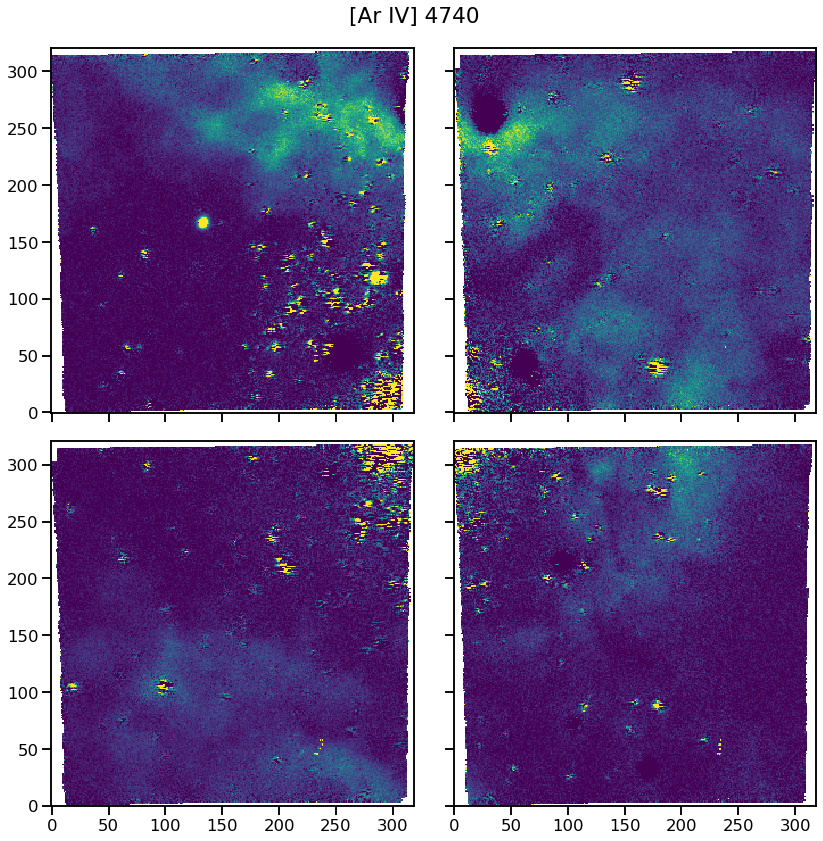

In [116]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4740, 4750).sum(axis=0).plot(
        ax=ax, 
        vmin=-10, 
        vmax=1500,
    )
fig.suptitle("[Ar IV] 4740")
fig.tight_layout();

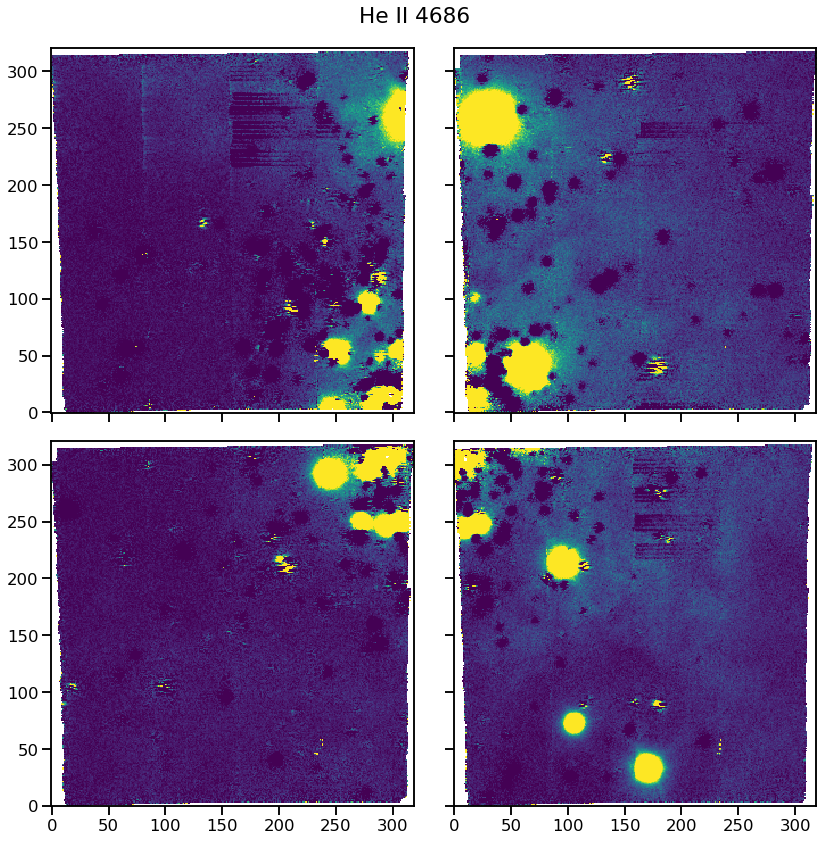

In [118]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4685, 4692).sum(axis=0).plot(
        ax=ax, 
        vmin=-10, 
        vmax=1500,
    )
fig.suptitle("He II 4686")
fig.tight_layout();

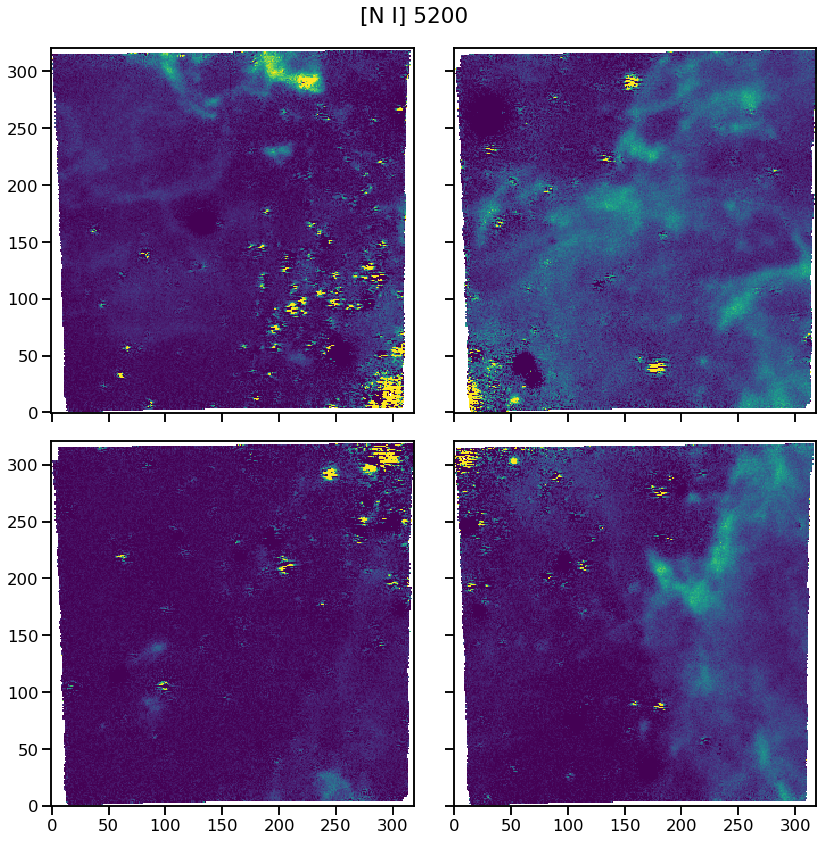

In [120]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(5200, 5210).sum(axis=0).plot(
        ax=ax, 
        vmin=-10, 
        vmax=1500,
    )
fig.suptitle("[N I] 5200")
fig.tight_layout();

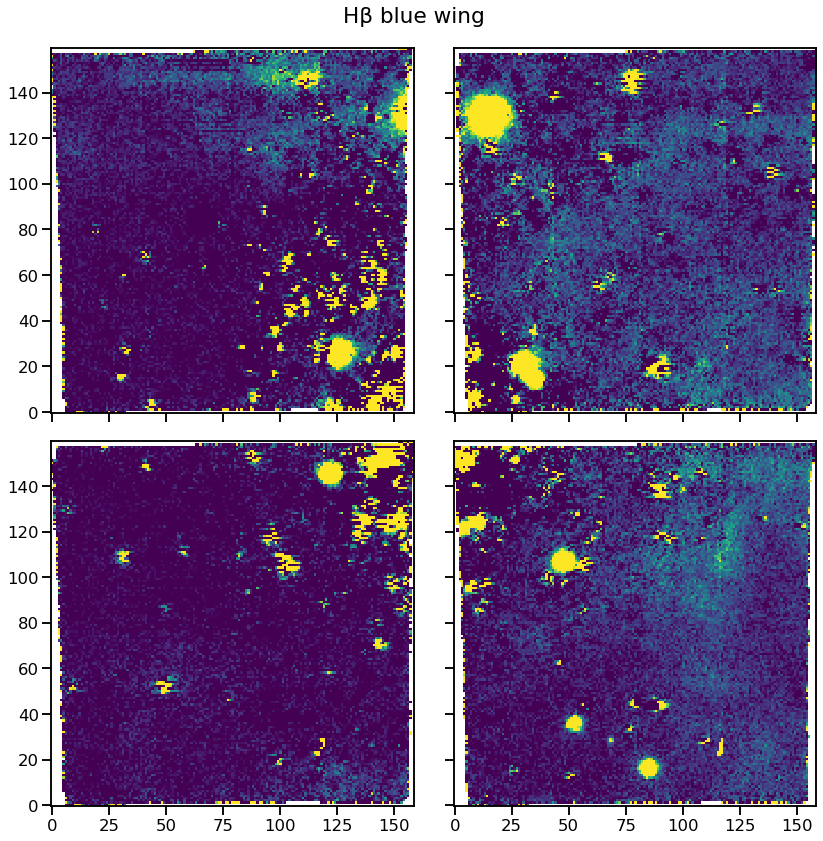

In [126]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4820, 4855).sum(axis=0).rebin(2).plot(
        ax=ax, 
        vmin=-10, 
        vmax=1000,
    )
fig.suptitle("Hβ blue wing")
fig.tight_layout();

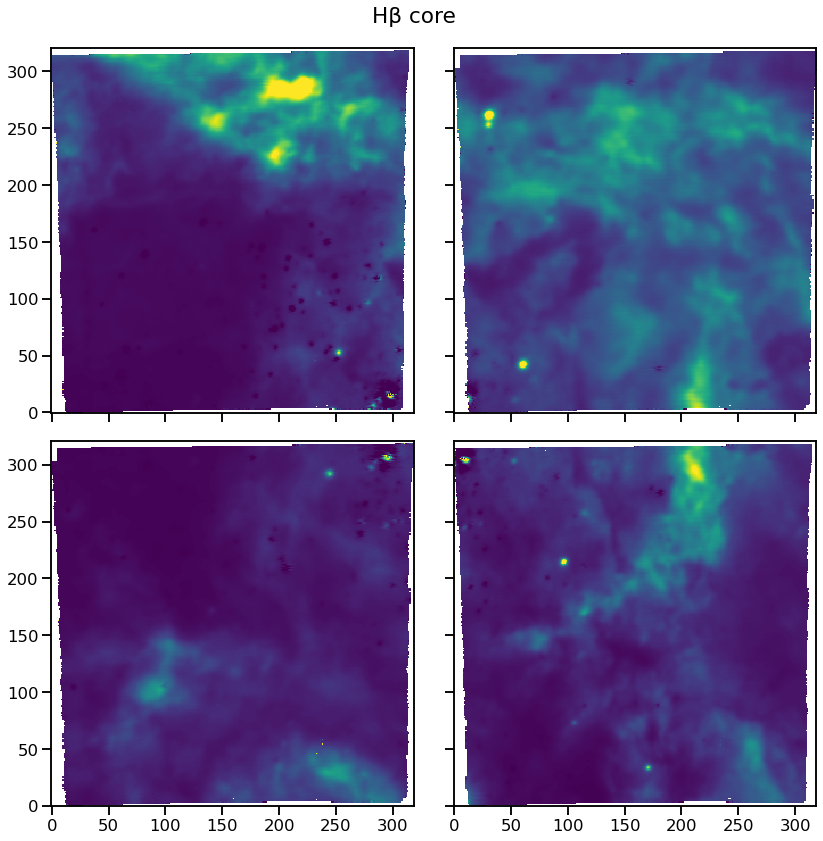

In [130]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4855, 4870).sum(axis=0).rebin(1).plot(
        ax=ax, 
        vmin=-10, 
        vmax=500000,
    )
fig.suptitle("Hβ core")
fig.tight_layout();

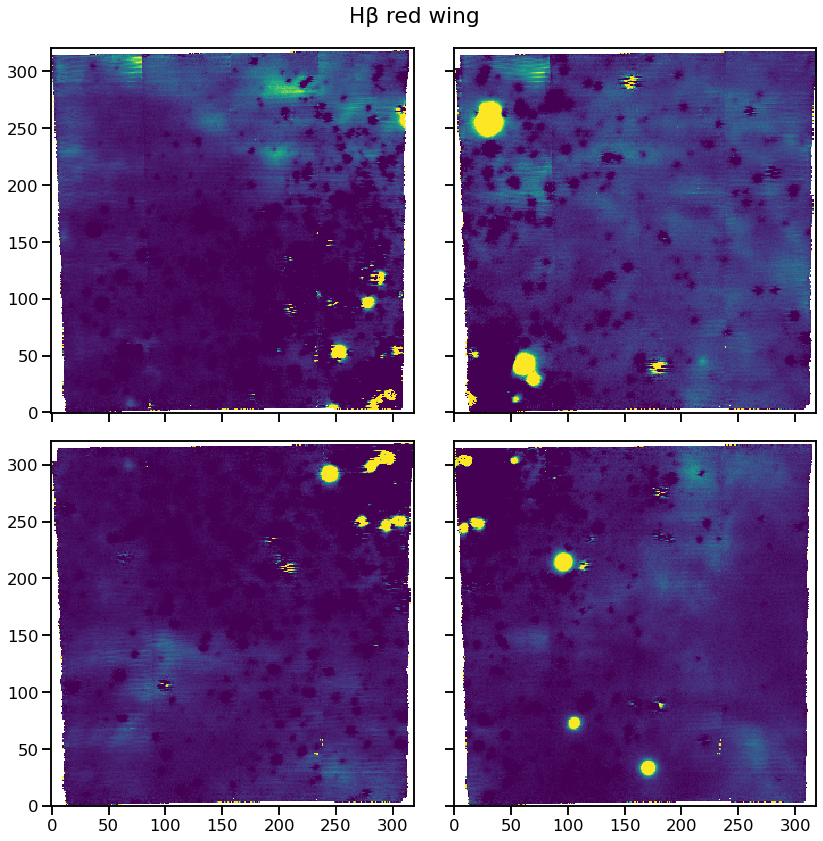

In [134]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4871 , 4876).sum(axis=0).rebin(1).plot(
        ax=ax, 
        vmin=-10, 
        vmax=3000,
    )
fig.suptitle("Hβ red wing")
fig.tight_layout();

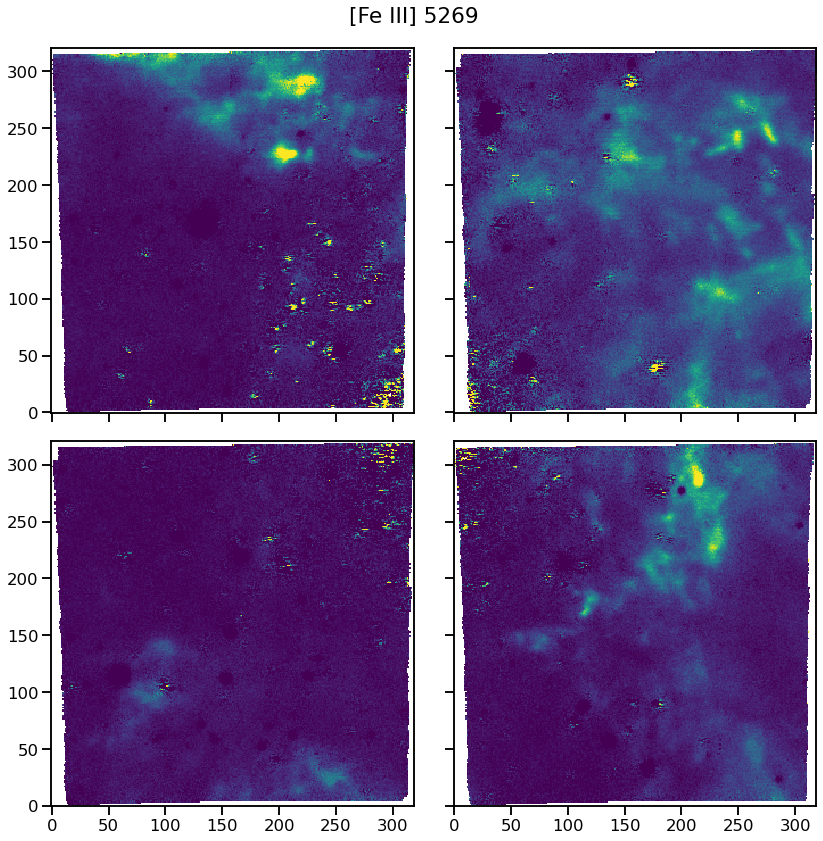

In [142]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(5268 , 5276).sum(axis=0).rebin(1).plot(
        ax=ax, 
        vmin=-10, 
        vmax=1500,
    )
fig.suptitle("[Fe III] 5269")
fig.tight_layout();

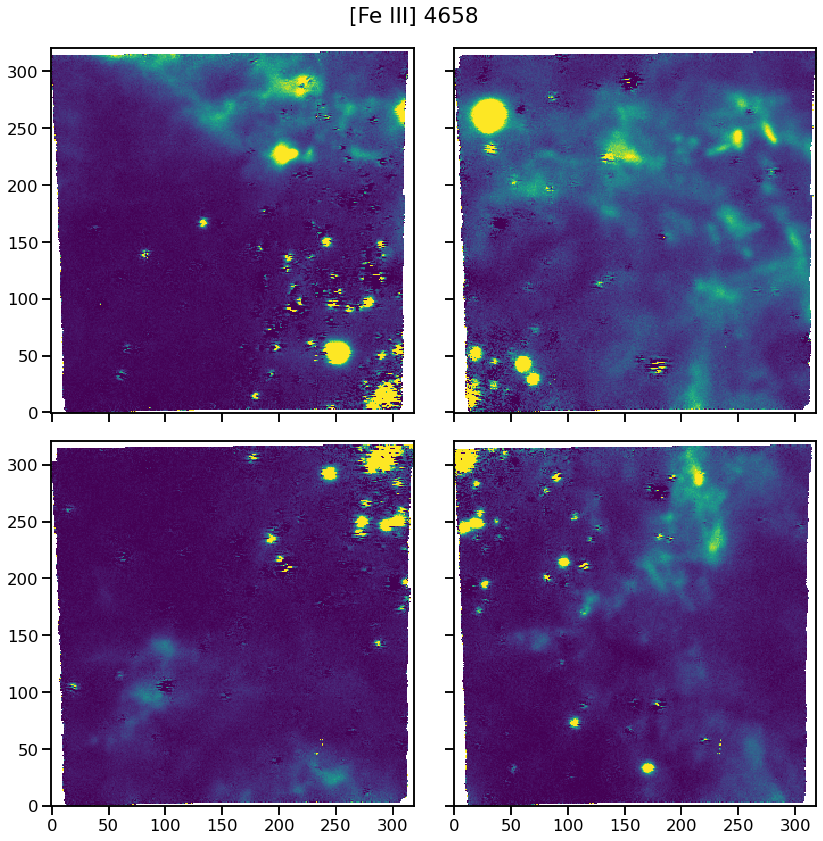

In [143]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4657, 4665).sum(axis=0).rebin(1).plot(
        ax=ax, 
        vmin=-10, 
        vmax=4000,
    )
fig.suptitle("[Fe III] 4658")
fig.tight_layout();

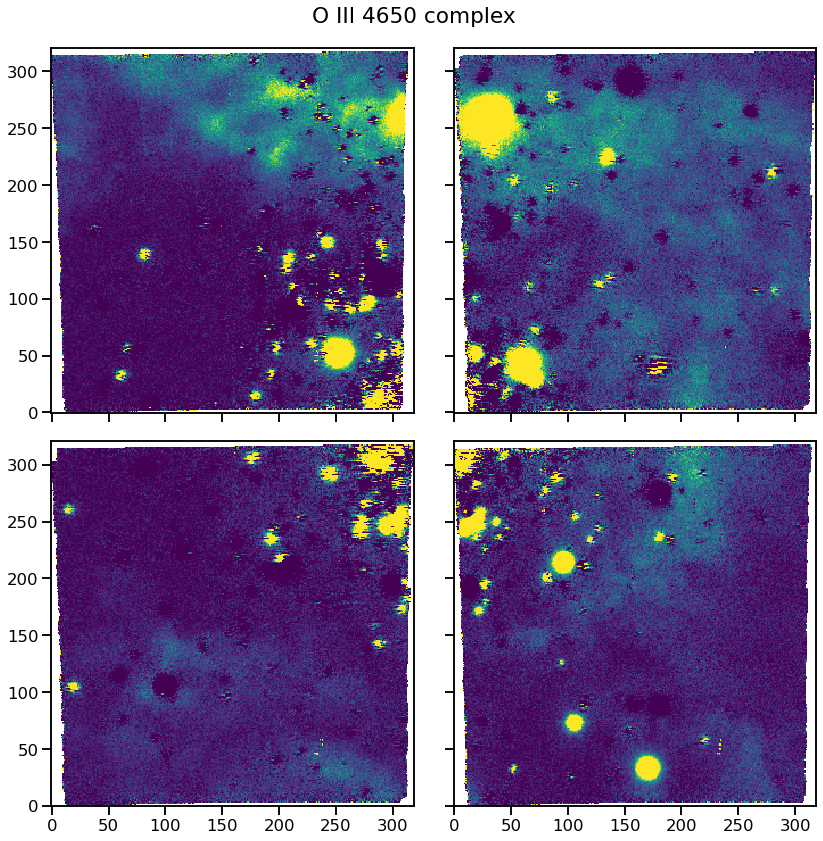

In [147]:
fig, axes = plt.subplots(
    2, 2, 
    figsize=(12, 12), 
    sharex=True, sharey=True
)
for cube, cont, ax in zip(
    [cubeD, cubeC, cubeB, cubeA],
    [contD, contC, contB, contA],
    axes.flat,
):
    (cube - cont).select_lambda(4641, 4659).sum(axis=0).rebin(1).plot(
        ax=ax, 
        vmin=-10, 
        vmax=2000,
    )
fig.suptitle("O III 4650 complex")
fig.tight_layout();